![cover](./img/cover.png)

![training](./img/training_european.png)

In [1]:
import AdvancedQF as aqf

import numpy as np
import pandas as pd
from time import time

import plotly.offline as po
import plotly.graph_objs as go

import ipywidgets as widgets
from ipywidgets import interact

from ipywidgets.embed import embed_minimal_html

po.init_notebook_mode(connected=True)

In [2]:
seed=1234
np.random.seed(seed)
z=np.random.randn(1000,100)
w = np.zeros((1000,100))
for i in range(1,100):
    w[:,i]=w[:,i-1]+z[:,i]/np.sqrt(100)

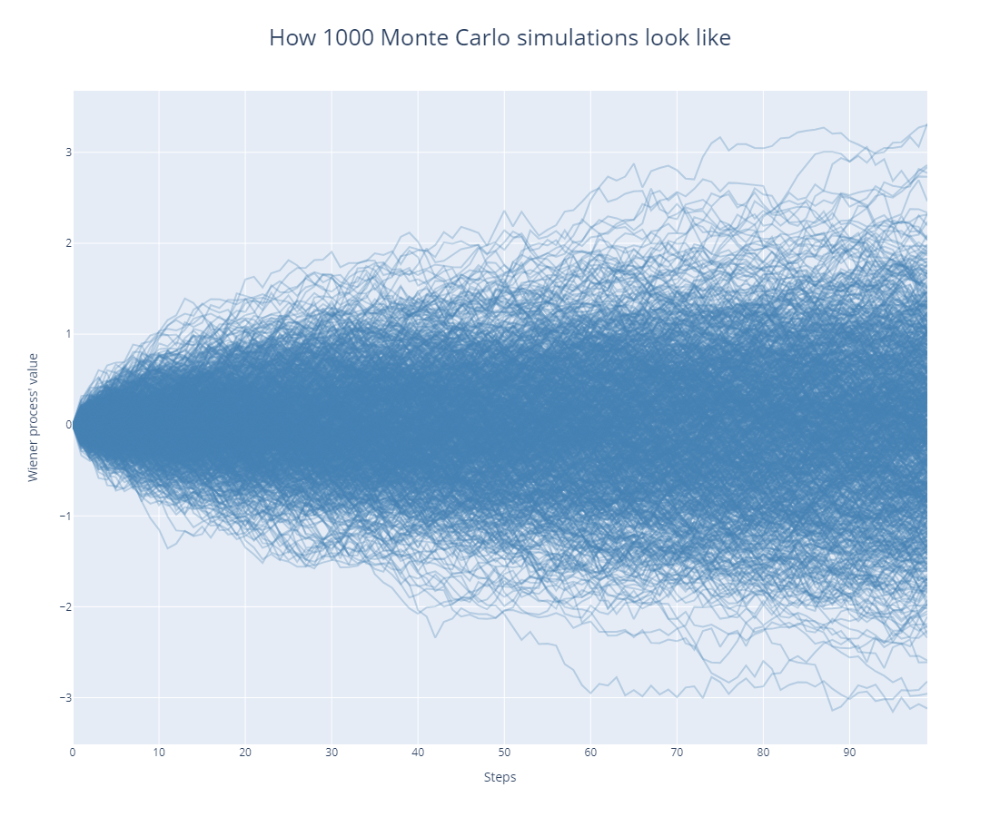

In [8]:
f= go.Figure()
for i in range(1000):
    f.add_trace(go.Scatter(y=w[i,:],line=dict(color='steelblue'),opacity=.3, name='Path {}'.format(i+1)))
f.update_layout(showlegend=False,height=900)
f.layout.title={'text':'How 1000 Monte Carlo simulations look like','font':{'size': 25},'x':0.5,'xanchor':'center'}
f.layout.xaxis={'title':'Steps'}
f.layout.yaxis={'title':'Wiener process\' value','hoverformat':'.4f'}
f.show()

**a) Assuming $S_0=100$, $\mu = 3%$, $\sigma = 40%$, $K=100$ and $T=1$, approximate the asset dymanics with a 100-step Euler scheme and compute the option premium through a 100-path Monte Carlo simulation.**

In [3]:
# INPUT DATA
spot = 100.
strike = 100.
mu = 0.03
sigma = 0.4
maturity = 1.

steps = 100 #Euler steps
mc = 100000 #Monte Carlo paths

fix_seed = True

In [20]:
# SIMULATION FUNCTION
def simulateEuropean(steps = 1000, simulations = 10000, spot = 100., strike = 100., mu = 0.03, sigma = 0.4, maturity = 1., show_results=True):
    # Avvio il cronometro
    start=time()
    # Creo un vettore di processi di Wiener, i.e. una matrice di dimensione [simulations] x [steps]
    wp = aqf.WienerProcess(maturity, steps,simulations,fix_seed)
    # Creo un vettore di processi che descrivono il sottostante e il payoff dell'opzione europea
    european = aqf.EuropeanCallOption(wp,spot,strike,mu,sigma,simulate_dynamics)
    # Eseguo la simulazione
    results = european.mc_simulation(steps,simulations)
    # Fermo il cronometro
    elapsed_simu = time()-start
    start_exact = time()
    premium = european.closed_formula_premium(False)
    elapsed_exact = time()-start_exact
    if show_results:
        # Stampo a video il risultato dopo l'ultima simulazione Monte Carlo e il tempo totale di esecuzione della simulazione
        print('Simulated premium: {:.15f}'.format(results['MC_Premium'].tolist()[-1]))
        print('Exact premium:\t   {:.15f}'.format(premium))
        print('-------------------------------------')
        print('Difference:        {:.15f}\n'.format(premium - results['MC_Premium'].tolist()[-1]))
        print('Simulation elapsed ({} steps, {} paths):\t{:.4f} sec.'.format(steps,simulations,elapsed_simu))
        print('Closed formula elapsed:                 \t{:.4f} sec.'.format(elapsed_exact))
    # Ritorno un DataFrame contenente, per ogni simulazione, il payoff, il premio calcolato sino a quel momento e l'errore Monte Carlo
    return results,premium

In [19]:
ex1, premium = simulateEuropean(steps,100000)

Simulated premium: 17.151362456507748
Exact premium:	   17.138735220515535
-------------------------------------
Difference:	   -0.012627235992213
Simulation elapsed (100 steps, 100000 paths):	1.6363 sec.
Closed formula elapsed:                 	0.0009 sec.


**b) What happens if, for a fixed number of steps in the Euler scheme, increase the number of Monte Carlo simulations? Plot the results and compare them with the closed formula.**

In [28]:
stored_data = pd.read_csv('input/european_dyn_simulation.csv', sep=',')
stored_data.tail()

,Und_Value,Payoff,MC_Premium,MC_Error,Simulation_Error,Steps,MC_Paths,Upper_MC_Error,Lower_MC_Error
99995,99.370641,0.000000,17.151940,2.946837,0.013205,100,99996,20.098777,14.205103
99996,74.017030,0.000000,17.151769,2.946802,0.013033,100,99997,20.098571,14.204966
99997,57.051031,0.000000,17.151597,2.946767,0.012862,100,99998,20.098365,14.204830
99998,51.198457,0.000000,17.151426,2.946732,0.012690,100,99999,20.098158,14.204693
99999,111.160966,11.160966,17.151362,2.946690,0.012627,100,100000,20.098052,14.204673


In [29]:
exercise_b = stored_data[(stored_data['Steps']==100)&(stored_data['MC_Paths'].isin([10*i for i in range(1,10000)]))]
a= exercise_b['MC_Premium'].tolist()
paths = exercise_b['MC_Paths'].tolist()
up = exercise_b['Upper_MC_Error'].tolist()
low = exercise_b['Lower_MC_Error'].tolist()
paths_rng = paths+paths[::-1]
mc_rng = up+low[::-1]

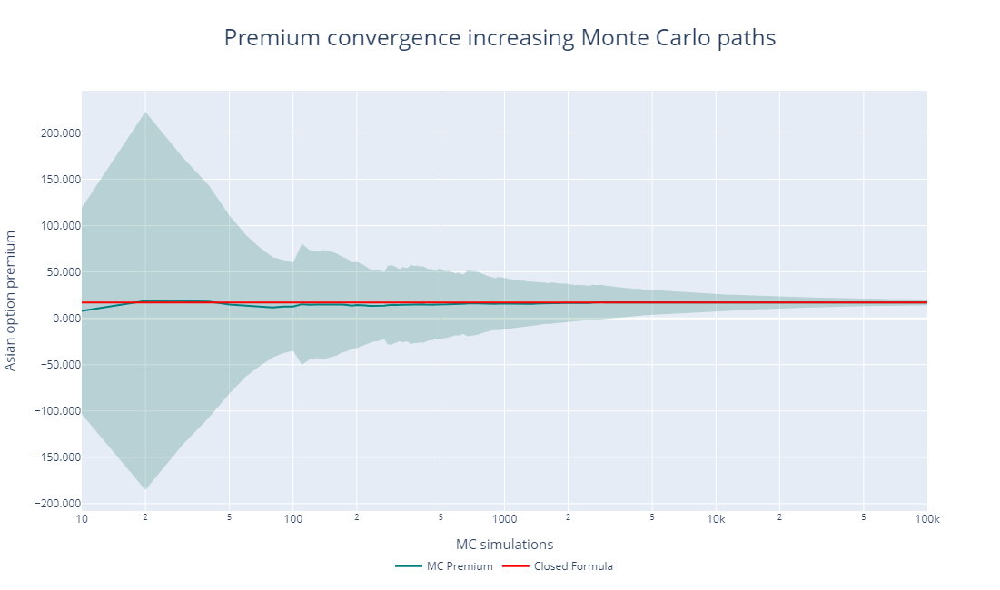

In [30]:
fig_b1 = go.FigureWidget()
fig_b1.add_trace(go.Scatter(x=paths_rng,y=mc_rng,fill='toself',fillcolor='rgba(0,100,80,0.2)',
                         line=dict(color='rgba(255,255,255,0)'),hoverinfo="skip",showlegend=False))
fig_b1.add_trace(go.Scatter(x=paths,y=exercise_b['MC_Premium'], name='MC Premium',line=dict(color='teal')))
fig_b1.add_trace(go.Scatter(x=paths,y=np.ones(len(a))*premium, name='Closed Formula',line=dict(color='red')))

fig_b1.layout.title={'text':'Premium convergence increasing Monte Carlo paths','font':{'size': 25},'x':0.5,'xanchor':'center'}
fig_b1.layout.yaxis={'fixedrange': False, 'title': 'Asian option premium','titlefont':{'size': 15}, 'tickformat':'.3f','hoverformat':'.6f'}
fig_b1.layout.xaxis={'title': 'MC simulations', 'titlefont':{'size': 15}}
fig_b1.layout.showlegend = True
fig_b1.update_xaxes(type="log")
fig_b1.layout.legend={'orientation':'h','x':0.5,'xanchor':'center'}
fig_b1.layout.height = 650
fig_b1.layout.hovermode = 'x'
fig_b1.show()
#fig_b1.write_html('output/european/Premium convergence increasing Monte Carlo paths (100 Euler steps).html')

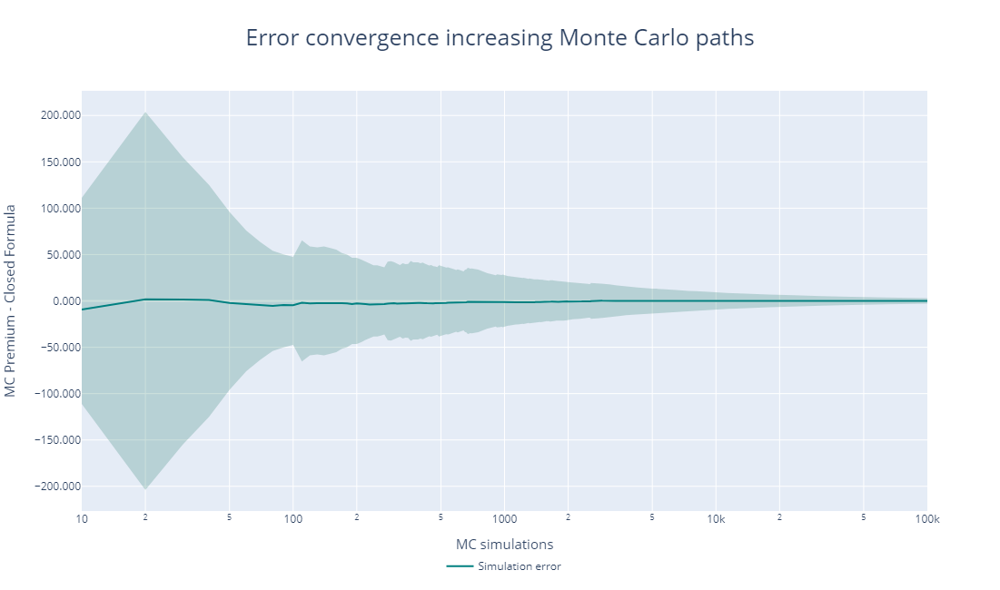

In [31]:
a = exercise_b['MC_Error'].tolist()
b = [-i for i in a]
error_rng = a+b[::-1]
fig_b2 = go.FigureWidget()
fig_b2.add_trace(go.Scatter(x=paths_rng,y=error_rng,fill='toself',fillcolor='rgba(0,100,80,0.2)',
                         line=dict(color='rgba(255,255,255,0)'),hoverinfo="skip",showlegend=False))
fig_b2.add_trace(go.Scatter(x=paths,y=exercise_b['Simulation_Error'], name='Simulation error',line=dict(color='teal')))

fig_b2.layout.title={'text':'Error convergence increasing Monte Carlo paths','font':{'size': 25},'x':0.5,'xanchor':'center'}
fig_b2.layout.yaxis={'fixedrange': False, 'title': 'MC Premium - Closed Formula','titlefont':{'size': 15},'tickformat':'.3f', 'hoverformat':'.6f'}
fig_b2.layout.xaxis={'title': 'MC simulations', 'titlefont':{'size': 15}}
fig_b2.layout.showlegend = True
fig_b2.update_xaxes(type="log")
fig_b2.layout.legend={'orientation':'h','x':0.5,'xanchor':'center'}
fig_b2.layout.height = 650
fig_b2.layout.hovermode = 'x'
fig_b2.show()
#fig_b2.write_html('output/european/Error convergence increasing Monte Carlo paths (100 Euler steps).html')